In [31]:
import numpy as np

data=np.load('data-mobile-net.npy')
target=np.load('target-mobile-net.npy')

#loading the save numpy arrays in the previous code

### Convolutional Neural Network Architecture

In [32]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model

baseModel = MobileNetV2(weights="imagenet", include_top=False,input_tensor=Input(shape=(224,224, 3)))

headModel = baseModel.output
headModel = AveragePooling2D(pool_size=(4, 4))(headModel)
headModel = Flatten(name="flatten")(headModel)
headModel = Dense(128, activation="relu")(headModel)
headModel = Dropout(0.5)(headModel)
headModel = Dense(2, activation="softmax")(headModel)


model = Model(inputs=baseModel.input, outputs=headModel)

for layer in baseModel.layers:
    
    layer.trainable = False

model.compile(loss="categorical_crossentropy", optimizer='adam',metrics=["accuracy"])
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_4 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 Conv1 (Conv2D)              (None, 112, 112, 32)         864       ['input_4[0][0]']             
                                                                                                  
 bn_Conv1 (BatchNormalizati  (None, 112, 112, 32)         128       ['Conv1[0][0]']               
 on)                                                                                              
                                                                                                  
 Conv1_relu (ReLU)           (None, 112, 112, 32)         0         ['bn_Conv1[0][0]']      

 rmalization)                                                                                     
                                                                                                  
 block_3_expand_relu (ReLU)  (None, 56, 56, 144)          0         ['block_3_expand_BN[0][0]']   
                                                                                                  
 block_3_pad (ZeroPadding2D  (None, 57, 57, 144)          0         ['block_3_expand_relu[0][0]'] 
 )                                                                                                
                                                                                                  
 block_3_depthwise (Depthwi  (None, 28, 28, 144)          1296      ['block_3_pad[0][0]']         
 seConv2D)                                                                                        
                                                                                                  
 block_3_d

 seConv2D)                                                                                        
                                                                                                  
 block_6_depthwise_BN (Batc  (None, 14, 14, 192)          768       ['block_6_depthwise[0][0]']   
 hNormalization)                                                                                  
                                                                                                  
 block_6_depthwise_relu (Re  (None, 14, 14, 192)          0         ['block_6_depthwise_BN[0][0]']
 LU)                                                                                              
                                                                                                  
 block_6_project (Conv2D)    (None, 14, 14, 64)           12288     ['block_6_depthwise_relu[0][0]
                                                                    ']                            
          

 block_9_project_BN (BatchN  (None, 14, 14, 64)           256       ['block_9_project[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_9_add (Add)           (None, 14, 14, 64)           0         ['block_8_add[0][0]',         
                                                                     'block_9_project_BN[0][0]']  
                                                                                                  
 block_10_expand (Conv2D)    (None, 14, 14, 384)          24576     ['block_9_add[0][0]']         
                                                                                                  
 block_10_expand_BN (BatchN  (None, 14, 14, 384)          1536      ['block_10_expand[0][0]']     
 ormalization)                                                                                    
          

 block_13_expand_BN (BatchN  (None, 14, 14, 576)          2304      ['block_13_expand[0][0]']     
 ormalization)                                                                                    
                                                                                                  
 block_13_expand_relu (ReLU  (None, 14, 14, 576)          0         ['block_13_expand_BN[0][0]']  
 )                                                                                                
                                                                                                  
 block_13_pad (ZeroPadding2  (None, 15, 15, 576)          0         ['block_13_expand_relu[0][0]']
 D)                                                                                               
                                                                                                  
 block_13_depthwise (Depthw  (None, 7, 7, 576)            5184      ['block_13_pad[0][0]']        
 iseConv2D

                                                                                                  
 block_16_depthwise (Depthw  (None, 7, 7, 960)            8640      ['block_16_expand_relu[0][0]']
 iseConv2D)                                                                                       
                                                                                                  
 block_16_depthwise_BN (Bat  (None, 7, 7, 960)            3840      ['block_16_depthwise[0][0]']  
 chNormalization)                                                                                 
                                                                                                  
 block_16_depthwise_relu (R  (None, 7, 7, 960)            0         ['block_16_depthwise_BN[0][0]'
 eLU)                                                               ]                             
                                                                                                  
 block_16_

In [33]:
from sklearn.model_selection import train_test_split

# Initial split: 90% train, 10% temporary
train_data, temp_data, train_target, temp_target = train_test_split(data, target, test_size=0.1, random_state=42)

# Split the temporary set into validation and test sets (50% each of the 10% = 5% each of the total dataset)
val_data, test_data, val_target, test_target = train_test_split(temp_data, temp_target, test_size=0.5, random_state=42)

# Check the shapes of the splits
print("Training set:", train_data.shape, train_target.shape)
print("Validation set:", val_data.shape, val_target.shape)
print("Testing set:", test_data.shape, test_target.shape)

Training set: (655, 224, 224, 3) (655, 2)
Validation set: (36, 224, 224, 3) (36, 2)
Testing set: (37, 224, 224, 3) (37, 2)


### Training the CNN for 10 epochs using train data 

In [35]:
# Train the model
history = model.fit(train_data, train_target, validation_data=(val_data, val_target), epochs=10)

Epoch 1/10
21/21 [==============================] - 18s 604ms/step - loss: 0.4305 - accuracy: 0.8260 - val_loss: 0.2124 - val_accuracy: 0.9444
Epoch 2/10
21/21 [==============================] - 9s 451ms/step - loss: 0.1876 - accuracy: 0.9313 - val_loss: 0.1632 - val_accuracy: 0.9444
Epoch 3/10
21/21 [==============================] - 9s 440ms/step - loss: 0.1209 - accuracy: 0.9481 - val_loss: 0.1256 - val_accuracy: 0.9722
Epoch 4/10
21/21 [==============================] - 10s 455ms/step - loss: 0.1122 - accuracy: 0.9618 - val_loss: 0.1353 - val_accuracy: 0.9444
Epoch 5/10
21/21 [==============================] - 9s 443ms/step - loss: 0.0775 - accuracy: 0.9695 - val_loss: 0.1097 - val_accuracy: 0.9444
Epoch 6/10
21/21 [==============================] - 10s 479ms/step - loss: 0.0678 - accuracy: 0.9710 - val_loss: 0.1096 - val_accuracy: 0.9444
Epoch 7/10
21/21 [==============================] - 10s 460ms/step - loss: 0.0550 - accuracy: 0.9771 - val_loss: 0.0940 - val_accuracy: 0.9444
Ep

### Visualizing the loss and the accuracy of trained CNN

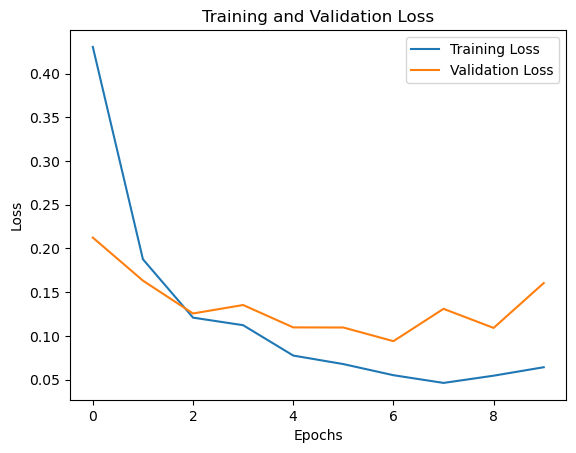

In [37]:
from matplotlib import pyplot as plt

# Assuming you have a trained model and history object
# For example:
# history = model.fit(...)

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')

# Add labels and title for better readability
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# Display the plot
plt.show()


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


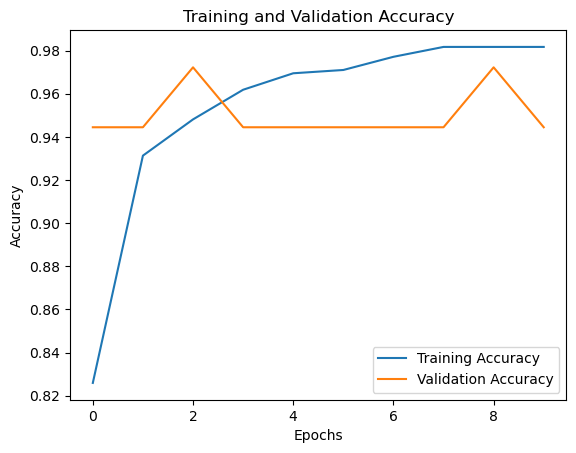

In [38]:
from matplotlib import pyplot as plt

# Check the keys in history.history to determine the correct key for accuracy
print(history.history.keys())

# Plot training & validation accuracy values
plt.plot(history.history.get('accuracy', history.history.get('acc')), label='Training Accuracy')
plt.plot(history.history.get('val_accuracy', history.history.get('val_acc')), label='Validation Accuracy')

# Add labels and title for better readability
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

# Display the plot
plt.show()


### Evaluating the CNN using testing_data

This returns the loss and the accuracy of the Neural Network for Testing data

In [39]:
print(model.evaluate(test_data,test_target))

2/2 [==============================] - 0s 85ms/step - loss: 0.2330 - accuracy: 0.9189
[0.23303508758544922, 0.9189189076423645]


In [62]:
# Assuming 'model' is your trained model
model.save(r'C:\Users\ASUS USER\Desktop\deep learning projects\plant_deseas_detection_trnsf lrning\deep learning projects.h5')


2/2 [==============================] - 1s 77ms/step - loss: 0.2330 - accuracy: 0.9189
Test Accuracy: 91.89%
2/2 [==============================] - 1s 97ms/step


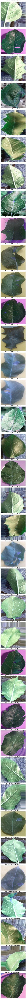

Sample 1: True Label: Healthy, Predicted Label: Healthy
Sample 2: True Label: Diseased, Predicted Label: Diseased
Sample 3: True Label: Healthy, Predicted Label: Healthy
Sample 4: True Label: Diseased, Predicted Label: Diseased
Sample 5: True Label: Healthy, Predicted Label: Healthy
Sample 6: True Label: Healthy, Predicted Label: Diseased
Sample 7: True Label: Healthy, Predicted Label: Healthy
Sample 8: True Label: Diseased, Predicted Label: Diseased
Sample 9: True Label: Diseased, Predicted Label: Diseased
Sample 10: True Label: Diseased, Predicted Label: Diseased
Sample 11: True Label: Diseased, Predicted Label: Diseased
Sample 12: True Label: Diseased, Predicted Label: Diseased
Sample 13: True Label: Diseased, Predicted Label: Diseased
Sample 14: True Label: Diseased, Predicted Label: Diseased
Sample 15: True Label: Diseased, Predicted Label: Diseased
Sample 16: True Label: Diseased, Predicted Label: Diseased
Sample 17: True Label: Healthy, Predicted Label: Healthy
Sample 18: True L

In [53]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load your saved model
model_path = r'C:\Users\ASUS USER\Desktop\deep learning projects.h5'
model = load_model(model_path)

# Assuming test_data and test_target are already split using train_test_split

# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(test_data, test_target)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Define class labels
class_labels = ['Diseased', 'Healthy']

# Make predictions on the test data
predictions = model.predict(test_data)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(test_target, axis=1)

# Display predictions for all images in the testing set
num_samples_to_display = len(test_data)

plt.figure(figsize=(15, 5 * num_samples_to_display))  # Adjust figure size for vertical display

# Iterate through each image and plot it vertically
for i in range(num_samples_to_display):
    plt.subplot(num_samples_to_display, 1, i + 1)  # Set up subplot grid for vertical display
    
    # Ensure correct display of images
    if test_data[i].dtype == np.float32:
        plt.imshow(test_data[i])
    else:
        plt.imshow(test_data[i].astype(np.uint8))
    
    # Map numeric labels to class names for display
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]
    
    plt.title(f'True: {true_label}, Predicted: {predicted_label}')
    plt.axis('off')

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

# Print the accuracy and prediction for all samples
for i in range(num_samples_to_display):
    print(f"Sample {i + 1}: True Label: {class_labels[true_classes[i]]}, Predicted Label: {class_labels[predicted_classes[i]]}")
